**PCA and NAPCA on MISI dataset**   
**Author: Ramesh Bhatta, CIS, RIT**   
**Data: Dr. Emmet Ientilucci, CIS, RIT**   

**INTRO:**  
This code exploits the power of PCA and NAPCA and use them for the noise removal in Multispectral Imagery. The dataset used for this 
lab is the multispectral Image of the Lake Ontario Shoreline located in Rochester, NY  which was taken using Modular Imaging Spectrometer Instrumeter(MISI) through airborne mean. The image has 16 bands in the NIR(730 nm to 985 nm). The processing steps of the dataset and the results are shown in sections below:

In [28]:
## Importing Libraries

import spectral
import spectral.io.envi as envi
import matplotlib.pyplot as plt
import numpy as np
import rasterio

In [29]:
## Predefined plot preferences

# Define text sizes
SMALL_SIZE = 14
MEDIUM_SIZE = 16
BIGGER_SIZE = 18

# Apply text size settings
plt.rc('font', size=SMALL_SIZE)          # Default font size
plt.rc('axes', titlesize=MEDIUM_SIZE)   # Axis title font size
plt.rc('axes', labelsize=MEDIUM_SIZE)   # Axis labels font size
plt.rc('xtick', labelsize=SMALL_SIZE)   # X-axis tick label font size
plt.rc('ytick', labelsize=SMALL_SIZE)   # Y-axis tick label font size
plt.rc('legend', fontsize=SMALL_SIZE)   # Legend font size
plt.rc('figure', titlesize=BIGGER_SIZE) # Figure title font size

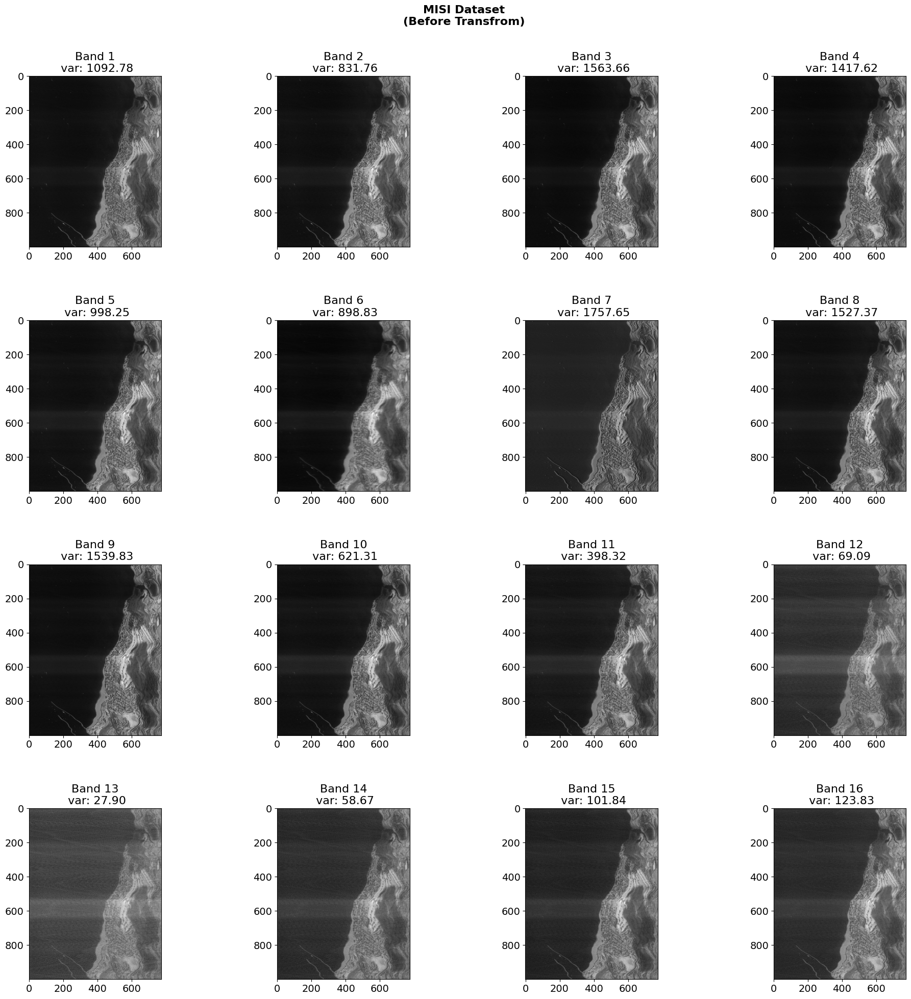

In [30]:
## Reading the data MISI data--> 16 bands MSI data
misi_dataset = envi.open('misi_board5_16band.hdr', "misi_board5_16band.img")
noise_dataset = envi.open('misi_board5_16band_noise_sub.hdr', "misi_board5_16band_noise_sub.img")

## Plot of all 16 bands of MISI dataset 
fig, axs = plt.subplots(4, 4, figsize=(20, 20))
for i in range(16):
    row = i // 4
    col = i % 4
    axs[row, col].imshow(misi_dataset[:, :, i], cmap='gray')
    axs[row, col].set_title(f'\n\nBand {i+1}\n var: {np.var(misi_dataset[:, :, i]):.2f}')
plt.suptitle('MISI Dataset\n(Before Transfrom)', fontsize=16, weight='bold')
plt.subplots_adjust(hspace=0.2, wspace=0.25)
plt.tight_layout()
plt.show()

<span style="color:green"><u>**1. Implementing PC transform on the MISI data.**</u></span>

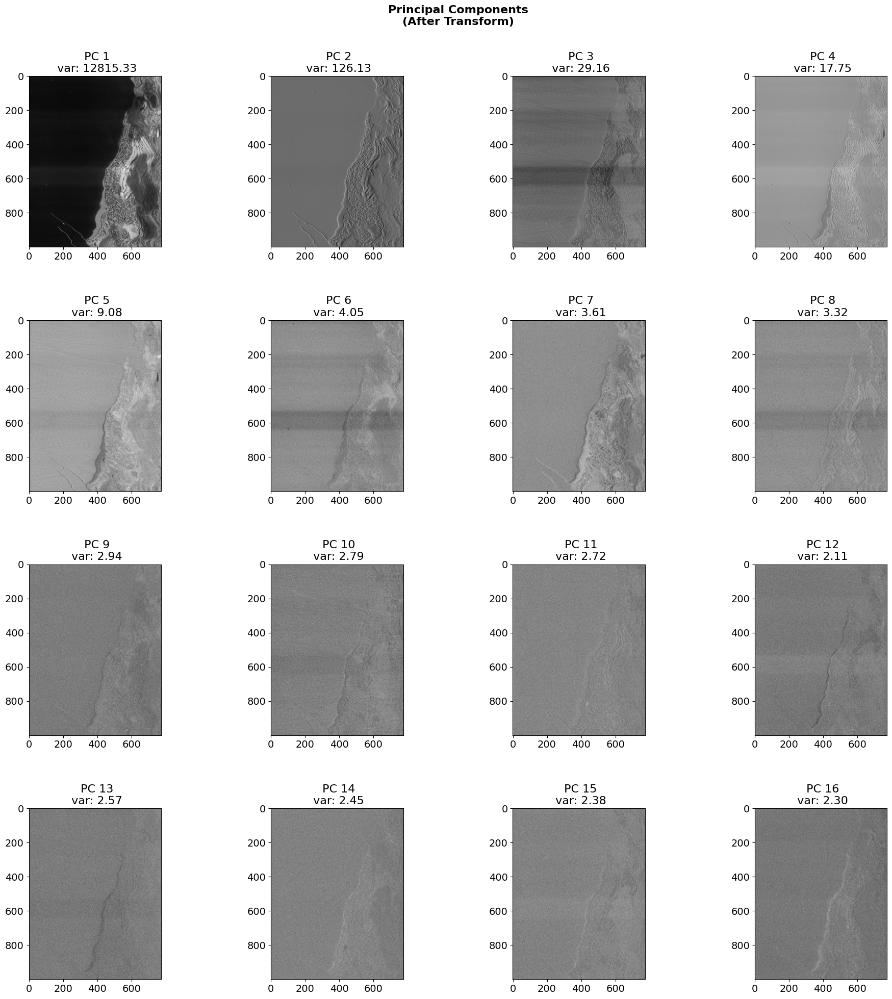

In [31]:
## Implementing the PCA in the MISI dataset

# a. Flatten Each channels of the MISI dataset
misi_dataset_flat = misi_dataset.load().reshape(misi_dataset.shape[0] * misi_dataset.shape[1], misi_dataset.shape[2])

# b. Calculate the mean subtracted data for each channels
for i in range(misi_dataset_flat.shape[1]):
    misi_dataset_flat[:, i] = (misi_dataset_flat[:, i] - np.mean(misi_dataset_flat[:, i]))

# c. Calculate the covariance matrix, eigen values and eigen vectors and PCs
m = misi_dataset_flat.shape[0]
covariance_matrix = np.dot(misi_dataset_flat.T, misi_dataset_flat) / (m - 1)
eigen_values, eigen_vectors = np.linalg.eig(covariance_matrix)
principal_components = np.dot(misi_dataset_flat, eigen_vectors)

# plot the principal components
fig, axs = plt.subplots(4, 4, figsize=(20, 20))
for i in range(16):
    row = i // 4
    col = i % 4
    axs[row, col].imshow(principal_components[:, i].reshape(misi_dataset.shape[0], misi_dataset.shape[1]), cmap='gray')
    axs[row, col].set_title(f'\n\n PC {i+1}\n var: {np.var(principal_components[:, i]):.2f}')
plt.suptitle('Principal Components\n(After Transform)', fontsize=16, weight='bold')
plt.subplots_adjust(hspace=0.2, wspace=0.0)
plt.tight_layout()
plt.show()

<span style="color:green"><u>**2. Variances, and covariances in both domains.**</u></span>

In [52]:
## Covariance matrix of the Principal Components

n = principal_components.shape[0]

# covariance matrix of the principal components
covariance_matrix_pca = np.dot(principal_components.T, principal_components) / (n - 1)

# First 4 rows of the covariance matrix
print(" First 4 rows of the Covariance matrix: \n\n ",covariance_matrix_pca.round()[0:4,:])

 First 4 rows of the Covariance matrix: 

  [[12815.     0.     0.     0.     0.     0.    -0.    -0.    -0.     0.
      0.     0.     0.    -0.     0.    -0.]
 [    0.   126.     0.     0.     0.    -0.     0.    -0.     0.     0.
     -0.    -0.    -0.    -0.    -0.     0.]
 [    0.     0.    29.    -0.     0.     0.    -0.    -0.     0.     0.
     -0.     0.     0.    -0.     0.     0.]
 [    0.     0.    -0.    18.     0.    -0.    -0.     0.    -0.    -0.
      0.     0.    -0.    -0.     0.    -0.]]


<span style="color:green"><u>**3. Eigen Value and Total Vaiability plot.**</u></span>

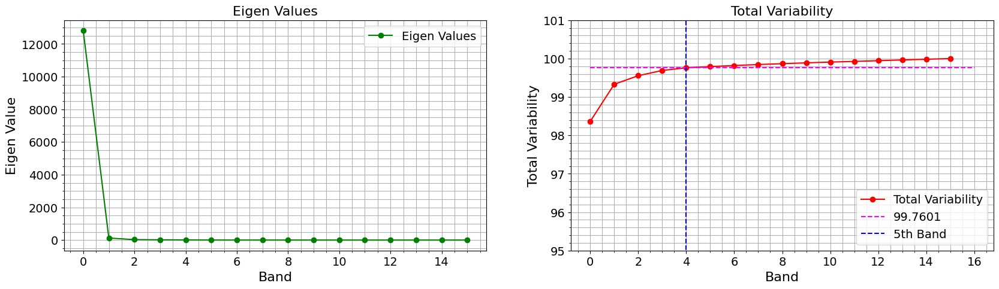

In [53]:
# plot of band vs eigen values and total variability

def tv(eigen_values):
    total_variability = []
    for i in range(16):
        intermediate = np.sum(eigen_values[:i+1])
        tv = intermediate / np.sum(eigen_values) * 100          # percent variability
        total_variability.append(tv)
            

    fig, axs = plt.subplots(1, 2, figsize=(20, 5))
    axs[0].plot(eigen_values, 'o-', color='green', label='Eigen Values')
    axs[0].set_title('Eigen Values')
    axs[0].set_xlabel('Band')
    axs[0].set_ylabel('Eigen Value')
    axs[0].grid(which='both')
    axs[0].minorticks_on()
    axs[0].legend()

    axs[1].plot(total_variability, 'o-', color='red', label='Total Variability')
    axs[1].set_title('Total Variability')
    axs[1].set_xlabel('Band')
    axs[1].set_ylabel('Total Variability')
    axs[1].grid(which='both')
    axs[1].hlines(total_variability[4], 0, 16, color='magenta', linestyles='dashed', label=round(total_variability[4],4))
    axs[1].vlines(4, 0, 105, color='blue', linestyles='dashed', label='5th Band')
    axs[1].minorticks_on()
    plt.ylim(95,101)
    axs[1].legend(loc='lower right')
    plt.show()
    return None  
tv(eigen_values)

**From the above plots we can see that around 99.76% of total variance in the data can be explained using just the first five principal components**

<span style="color:green"><u>**4. Visualizing the latter bands!!**</u></span>

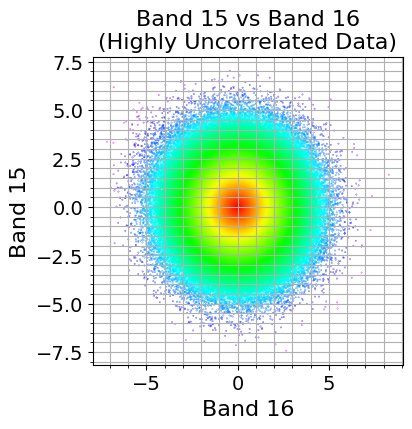

In [54]:
## Plot of band 15 vs band 16 data of PC data

intensity = np.sqrt(principal_components[:, 14]**2 + principal_components[:, 15]**2)
fig = plt.figure(figsize=(4, 4))
plt.scatter(principal_components[:, 15], principal_components[:, 14], c = intensity, cmap='hsv', s=0.05)
plt.xlabel('Band 16')
plt.ylabel('Band 15')
plt.title('Band 15 vs Band 16\n(Highly Uncorrelated Data)')
plt.grid(which='both')
plt.minorticks_on()
plt.show()

**The latter bands are Highly Uncorrelated noise bands.**

<span style="color:green"><u>**5. Eliminating the latter band/Noisy bands and projecting remaining bands back to original domain. Also visualizing the results to see when can we see noise reduction**</u>  


In [55]:
## Taking the first n principal components and projecting back to original space

# Taking first principle component only and making the rest zero

def preserve_npcs(n, principal_components, eigen_vectors):
    principal_components_n = np.zeros_like(principal_components)
    principal_components_n[:, :n] = principal_components[:, :n]
    original_space_dataset_flat = np.dot(principal_components_n, eigen_vectors.T)

    ## Add the mean back to the data
    for i in range(original_space_dataset_flat.shape[1]):
        mean_added = (original_space_dataset_flat[:, i] + np.mean(misi_dataset_flat[:, i]))
        original_space_dataset_flat[:, i] = mean_added
    
    ## Reshape the data to original shape
    
    reshaped_data = original_space_dataset_flat.reshape(misi_dataset.shape[0], misi_dataset.shape[1], misi_dataset.shape[2])    
    
    return reshaped_data

## Taking Only 1st Principal Component
misi_dataset_1 = preserve_npcs(1, principal_components, eigen_vectors)


## Taking 3 Principal Components
misi_dataset_3 = preserve_npcs(3, principal_components, eigen_vectors)

## Taking 5 Principal Components
misi_dataset_5 = preserve_npcs(5, principal_components, eigen_vectors)

## Taking 7 Principal Components
misi_dataset_7 = preserve_npcs(7, principal_components, eigen_vectors)

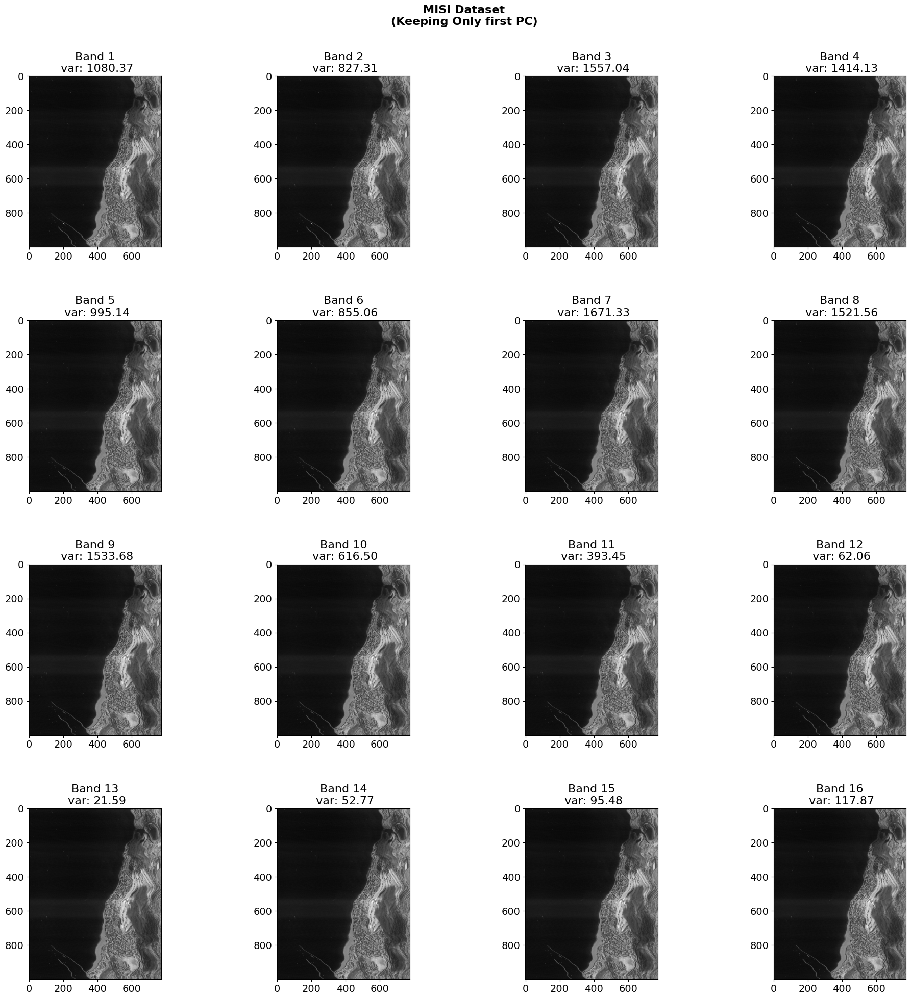

In [36]:
# Plot all bands of the data for each case:

## Using First Principal Component Only:

fig, axs = plt.subplots(4, 4, figsize=(20, 20))
for i in range(16):
    row = i // 4
    col = i % 4
    axs[row, col].imshow(misi_dataset_1[:, :, i], cmap='gray')
    axs[row, col].set_title(f'\n\nBand {i+1}\n var: {np.var(misi_dataset_1[:, :, i]):.2f}')
plt.suptitle('MISI Dataset\n(Keeping Only first PC)', fontsize=16, weight='bold')
plt.subplots_adjust(hspace=0.2, wspace=0.25)
plt.tight_layout()
plt.show()


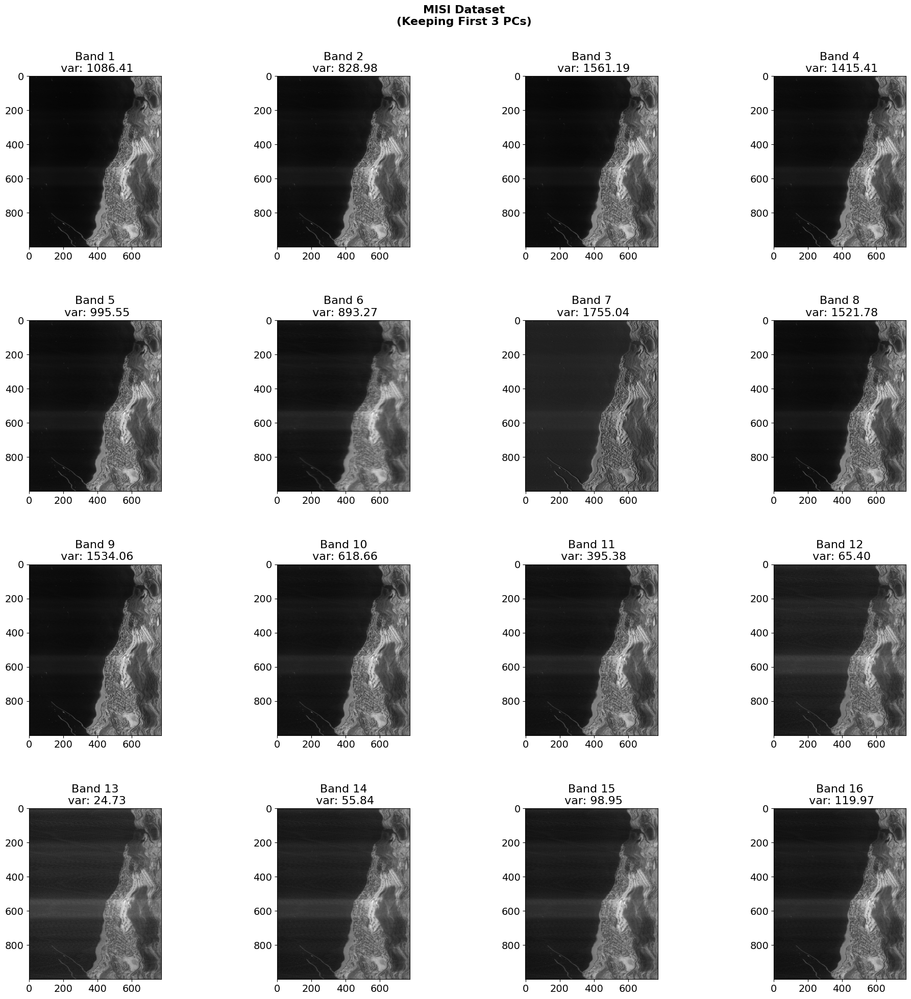

In [56]:
## Using First 3 Principal Components:

fig, axs = plt.subplots(4, 4, figsize=(20, 20))

for i in range(16):
    row = i // 4
    col = i % 4
    axs[row, col].imshow(misi_dataset_3[:, :, i], cmap='gray')
    axs[row, col].set_title(f'\n\nBand {i+1}\n var: {np.var(misi_dataset_3[:, :, i]):.2f}')
plt.suptitle('MISI Dataset\n(Keeping First 3 PCs)', fontsize=16, weight='bold')
plt.subplots_adjust(hspace=0.2, wspace=0.25)
plt.tight_layout()
plt.show()


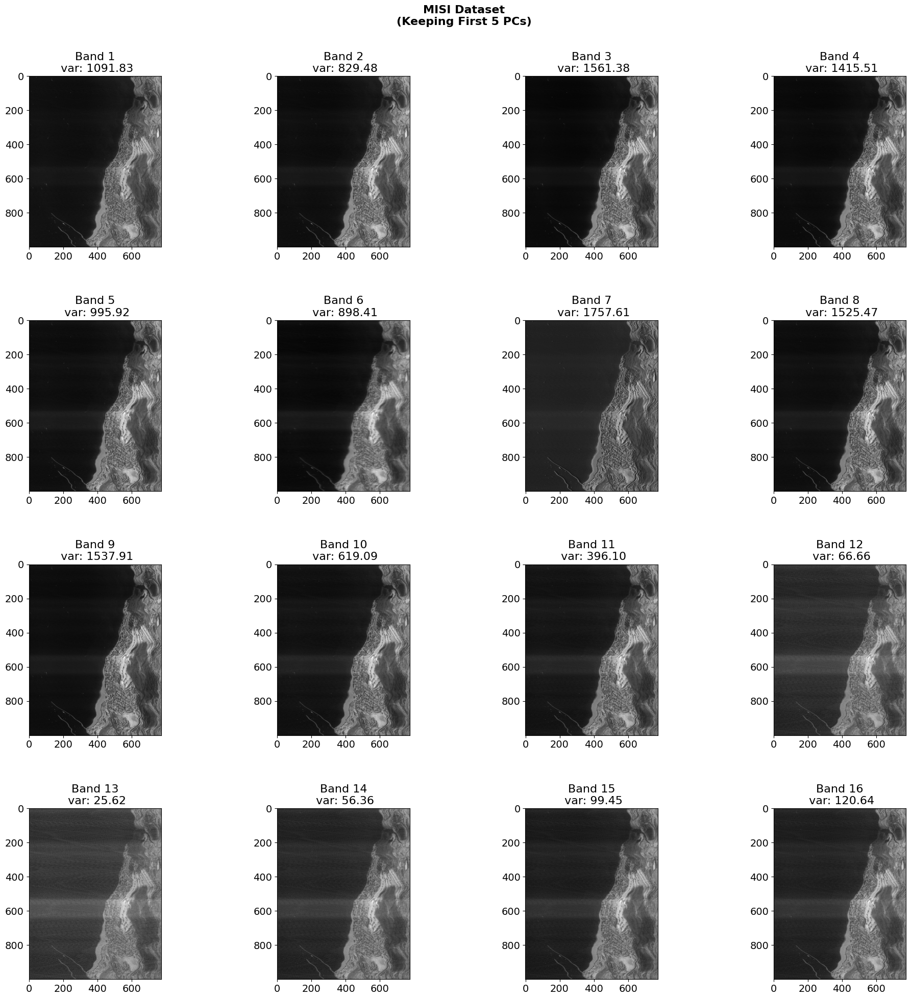

In [57]:
## Using First 5 Principal Components:

fig, axs = plt.subplots(4, 4, figsize=(20, 20))
for i in range(16):
    row = i // 4
    col = i % 4
    axs[row, col].imshow(misi_dataset_5[:, :, i], cmap='gray')
    axs[row, col].set_title(f'\n\nBand {i+1}\n var: {np.var(misi_dataset_5[:, :, i]):.2f}')
plt.suptitle('MISI Dataset\n(Keeping First 5 PCs)', fontsize=16, weight='bold')
plt.subplots_adjust(hspace=0.2, wspace=0.25)
plt.tight_layout()
plt.show()    

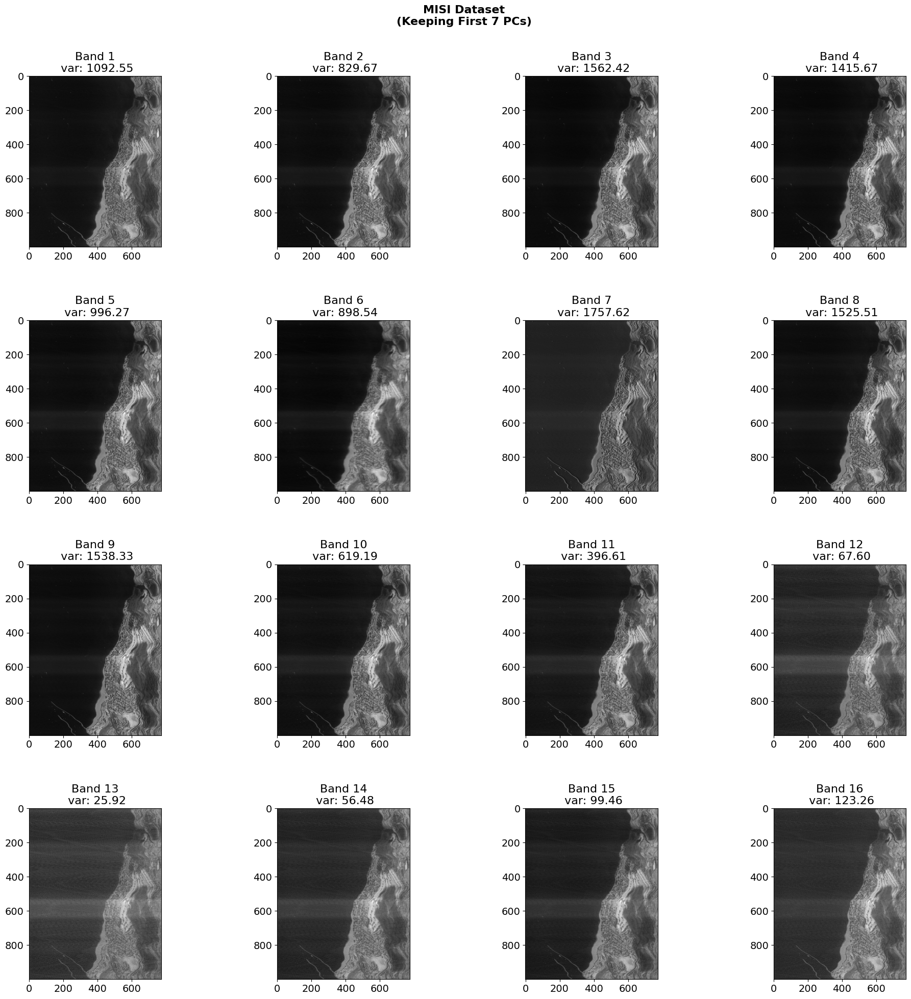

In [58]:
## Using First 7 Principal Components:

fig, axs = plt.subplots(4, 4, figsize=(20, 20))
for i in range(16):
    row = i // 4
    col = i % 4
    axs[row, col].imshow(misi_dataset_7[:, :, i], cmap='gray')
    axs[row, col].set_title(f'\n\nBand {i+1}\n var: {np.var(misi_dataset_7[:, :, i]):.2f}')
plt.suptitle('MISI Dataset\n(Keeping First 7 PCs)', fontsize=16, weight='bold')
plt.subplots_adjust(hspace=0.2, wspace=0.25)
plt.tight_layout()
plt.show()

**From Visuals we can see that After Band 3 the noise is appearing in all the channels. We can also plot how variance changes for each bands if we keep 'n' PC components during inverse
transformation. This is shown below:**

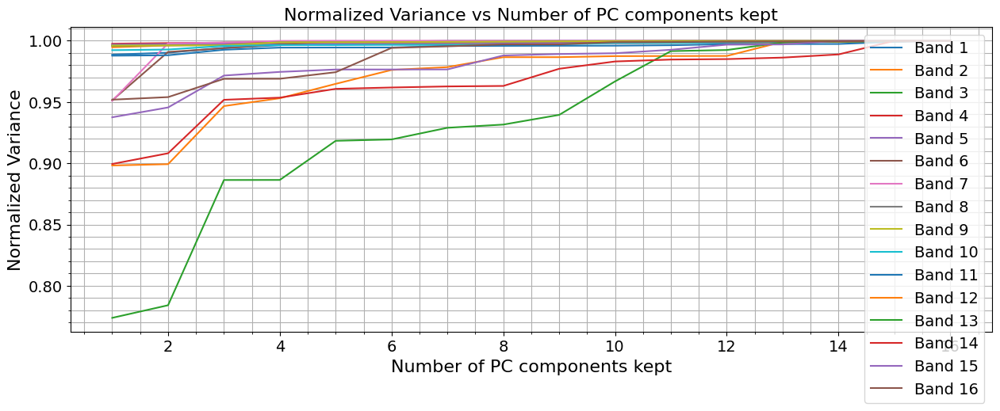

In [59]:
## Plot Of variance of each bands vs number of bands kept in the PCA
def plot_var(wmatrix, principal_components, eigen_vectors):
    variance = []
    band_kept = []
    for i in range(1, 17):
        band_kept.append(i)
        principal_components_n = np.zeros_like(principal_components)
        principal_components_n[:, :i] = principal_components[:, :i]
        original_space_dataset_flat = np.dot(principal_components_n, eigen_vectors.T)
        original_space_dataset_flat = np.dot(original_space_dataset_flat, wmatrix)
        reshaped_dataset = original_space_dataset_flat.reshape(misi_dataset.shape[0], misi_dataset.shape[1], misi_dataset.shape[2])
        var = [np.var(reshaped_dataset[:, :, j]) for j in range(16)]
        variance.append(var)   
        
    
    
    ## Plot of variance of each bands vs number of bands kept in the PCA
    fig = plt.figure(figsize=(15, 5))
    for i in range(16):
        var = [variance[j][i] for j in range(16)]
        plt.plot(band_kept, var/np.max(var), label=f'Band {i+1}', linewidth= 1.5)
    plt.xlabel('Number of PC components kept')
    plt.ylabel('Normalized Variance')
    plt.title('Normalized Variance vs Number of PC components kept')
    plt.grid(which='both')
    plt.minorticks_on()
    plt.legend()
    plt.show()
    return None

## Plotting
plot_var(1, principal_components, eigen_vectors)

**We can see that the variance in first 11 components do not change a lot with the number of bands kept in PC domain. However Onwards bands 12 there is significant change in the
variance when the number of pc band kept are varied. Keeping less PC components results less variance, and keeping more PC components resulted higher variance. This indicates that these higher PC components are result of noise in the system.**

<span style="color:green"><u>**6. Now implementing a NAPC transform in the MISI data using noise data to see if it produces better results than 'regular' PCA**</u></span>

**Noise Adjusted Principal Components Analysis**

In [41]:
# Noise covariance matrix

noise_dataset_flat = noise_dataset.load().reshape(noise_dataset.shape[0] * noise_dataset.shape[1], noise_dataset.shape[2])
mean_subtracted_noise = noise_dataset_flat - np.mean(noise_dataset_flat, axis=0)
m = noise_dataset_flat.shape[0]
noise_cov = np.dot(mean_subtracted_noise.T, mean_subtracted_noise) / (m - 1)

# Noise Whitening

noise_eigen_values, noise_eigen_vectors = np.linalg.eig(noise_cov)
scaling_matrix = np.diag(1.0 / np.sqrt(noise_eigen_values))
whitening_matrix = np.dot(noise_eigen_vectors, scaling_matrix)

In [42]:
## Now we can use the whitening matrix to whiten the data i.e put the centered noisy data into noise whitened space

A_centered = misi_dataset_flat               ## A is the centered Signal + Noise data
A_whitened = np.dot(A_centered, whitening_matrix)

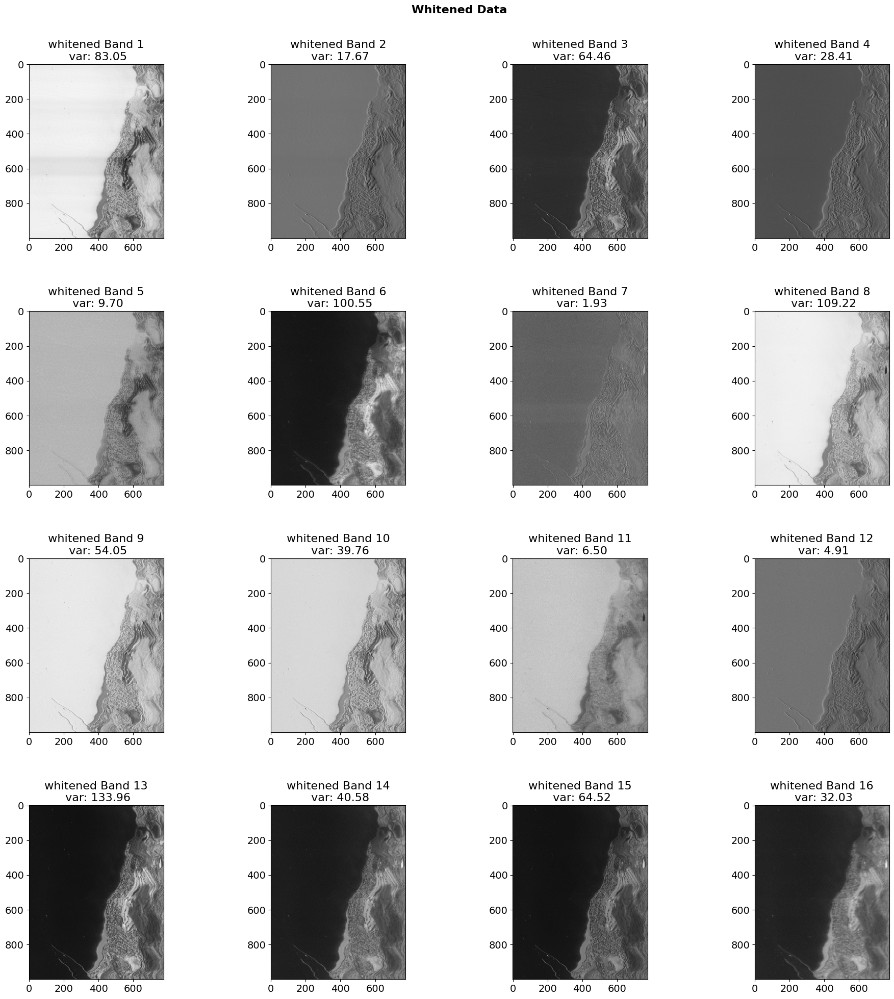

In [43]:
## Plot of the whitened Bands

fig, axs = plt.subplots(4, 4, figsize=(20, 20))
for i in range(16):
    row = i // 4
    col = i % 4
    axs[row, col].imshow(A_whitened[:, i].reshape(misi_dataset.shape[0], misi_dataset.shape[1]), cmap='gray')
    axs[row, col].set_title(f'\n\n whitened Band {i+1} \n var: {np.var(A_whitened[:, i]):.2f}')
plt.suptitle('Whitened Data', fontsize=16, weight='bold')
plt.subplots_adjust(hspace=0.2, wspace=0.0)
plt.tight_layout()
plt.show()






**NAPC Transformed Output**

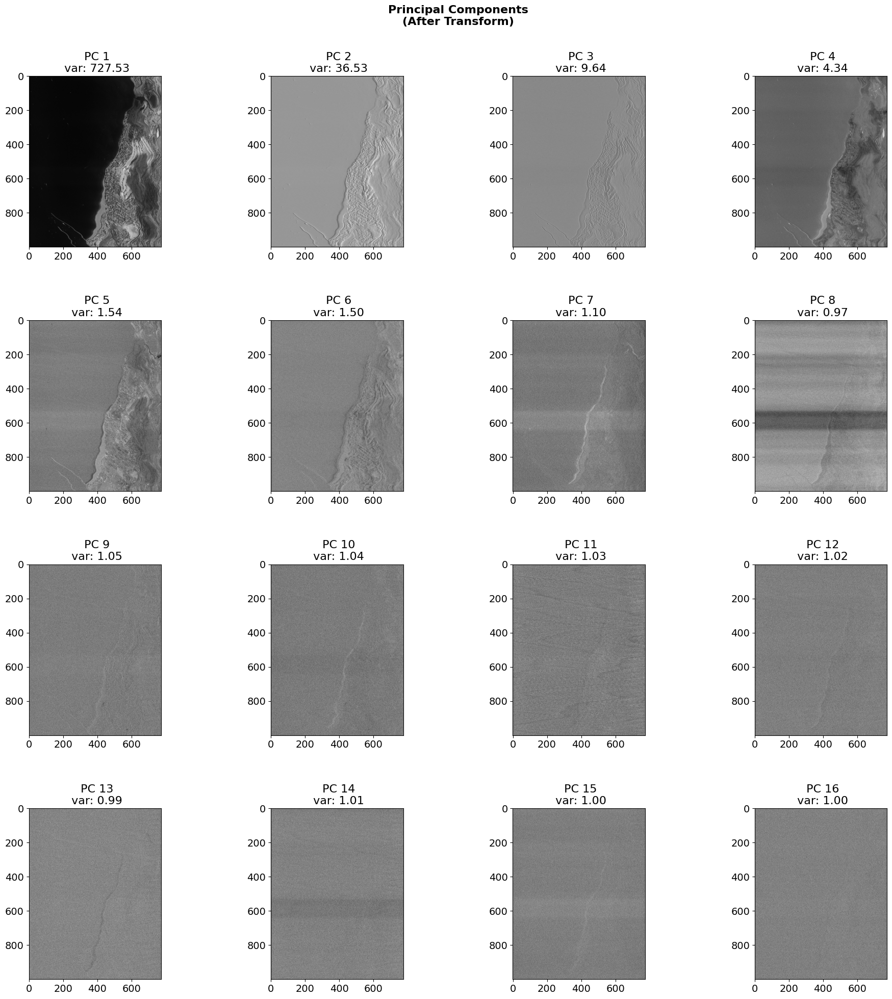

In [60]:
# Now we can use the whitened data to perform PCA

# a. Calculate the covariance matrix
m = A_whitened.shape[0]
covariance_matrix = np.dot(A_whitened.T, A_whitened) / (m - 1)

# b. Calculate the eigen values and eigen vectors
evals, evecs = np.linalg.eig(covariance_matrix)

# c. Find the Principal Components
principal_components_napc = np.dot(A_whitened, evecs)

# plot the principal components
fig, axs = plt.subplots(4, 4, figsize=(20, 20))
for i in range(16):
    row = i // 4
    col = i % 4
    axs[row, col].imshow(principal_components_napc[:, i].reshape(misi_dataset.shape[0], misi_dataset.shape[1]), cmap='gray')
    axs[row, col].set_title(f'\n\n PC {i+1}\n var: {np.var(principal_components_napc[:, i]):.2f}')
plt.suptitle('Principal Components\n(After Transform)', fontsize=16, weight='bold')
plt.subplots_adjust(hspace=0.2, wspace=0.0)
plt.tight_layout()
plt.show()

**NAPC is different from PCA because it also takes in consideration the Noise distribution in the dataset and whitens the data with the noise. In PCA the implied assumption is that variance equates to information while in NAPC SNR is taken as information and we try to find the basis where basis funcions are ordered according to SNR. The result also looks much better with this assumption using NAPC.**

<span style="color:green">**<u>7. Variances, and covariances in both domains.</u>**</span>

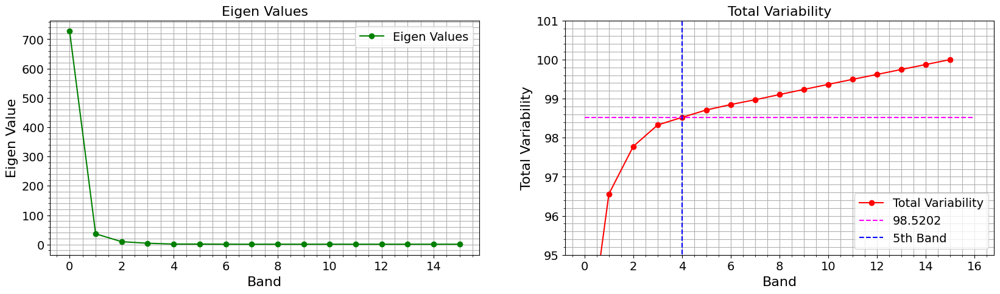

In [45]:
## Total Vairability and Eigen Value plot
tv(evals)

**The Eigen values and Total Variability curve are shown above. The Eigen Value plot differs from the plot of PCA in a sense that plot for NAPC contains lower values. In the total variability plot we can see that 5 bands represent about 98.5% of information(SNR) in the data which is lesser than the regular PCA. Also this curve implies that we need higher number of bands to get total higher variability.** 

<span style="color:green"><u>**8. Visualizing the latter bands!!**</u></span>

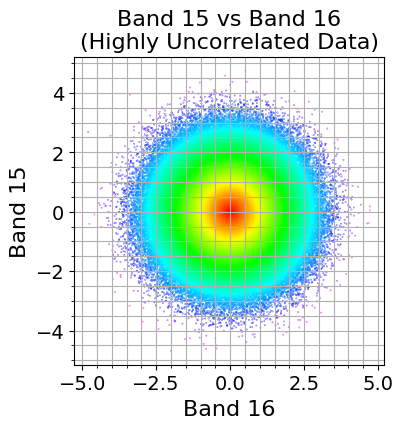

In [61]:
## Plot of band 15 vs band 16 data of PC data

intens = np.sqrt(principal_components_napc[:, 14]**2 + principal_components_napc[:, 15]**2)
fig = plt.figure(figsize=(4, 4))
plt.scatter(principal_components_napc[:, 15], principal_components_napc[:, 14], c = intens, cmap='hsv', s=0.05)
plt.xlabel('Band 16')
plt.ylabel('Band 15')
plt.title('Band 15 vs Band 16\n(Highly Uncorrelated Data)')
plt.grid(which='both')
plt.minorticks_on()
plt.show()

**The bands are decorrelated and we dont see much Difference between plots of these bands in both PCA and NAPC. This may explain that these band represent the absolute noise present in the data.** 

<span style="color:green"><u>**9. Eliminating the latter band/Noisy bands and projecting remaining bands back to original domain. Also visualizing the results to see when can we see noise reduction**</u></span>  

**Taking the first n principal components and projecting back to original space.**

In [47]:
##  Preserve n PCs

def preserve_npc(n, principal_components, eigen_vectors, whitening_matrix):
    principal_components_n = np.zeros_like(principal_components)
    principal_components_n[:, :n] = principal_components[:, :n]
    whitened_space_dataset_flat = np.dot(principal_components_n, eigen_vectors.T)
    unwhitened_space_dataset_flat = np.dot(whitened_space_dataset_flat, np.linalg.inv(whitening_matrix))
    
    ## Reshape the data to original shape
    reshaped_data = unwhitened_space_dataset_flat.reshape(misi_dataset.shape[0], misi_dataset.shape[1], misi_dataset.shape[2])
    
    # plot unwhitened space data
    fig, axs = plt.subplots(4, 4, figsize=(20, 20))
    for i in range(16):
        row = i // 4
        col = i % 4
        axs[row, col].imshow(reshaped_data[:, :, i], cmap='gray')
        axs[row, col].set_title(f'\n\n Band {i+1}\n var: {np.var(reshaped_data[:, :, i]):.2f}')
    plt.suptitle('Reconstructed Data taking {} PC(s)'.format(n), fontsize=16, weight='bold')
    plt.subplots_adjust(hspace=0.2, wspace=0.0)
    plt.tight_layout()
    plt.show()
    return reshaped_data





**Taking Only 1st Principal Component**

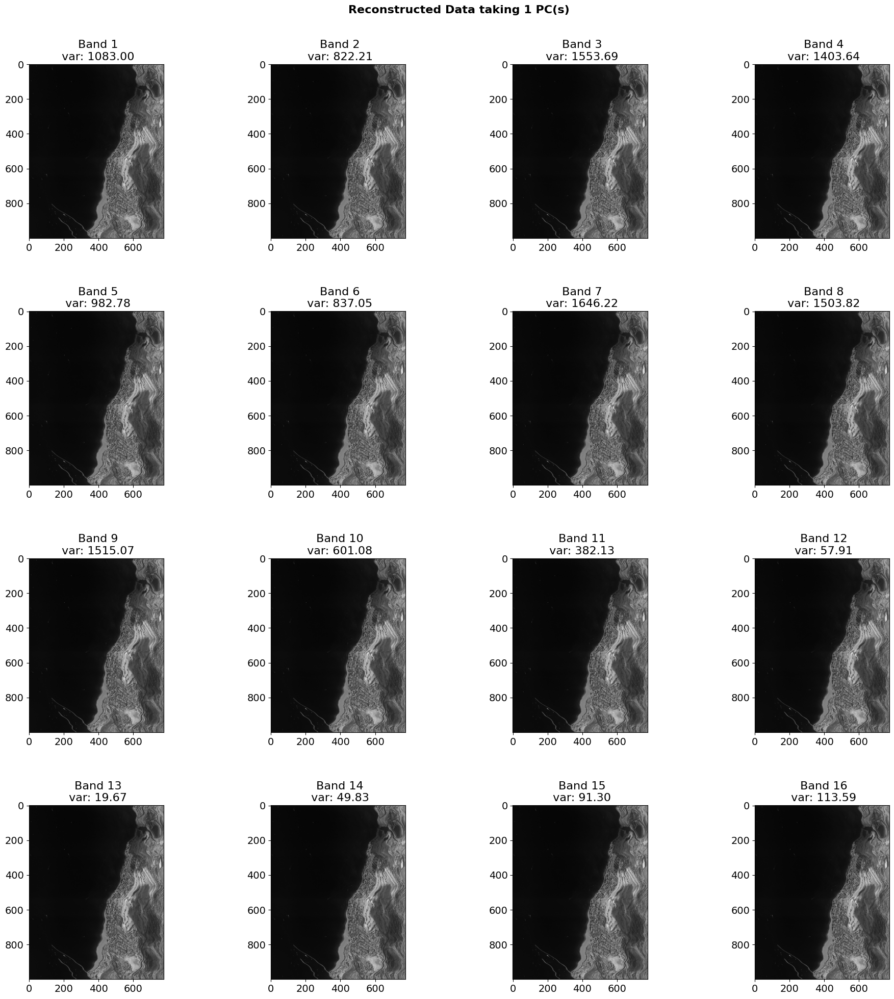

In [48]:
## Taking Only 1st Principal Component

napc_misi_dataset_1 = preserve_npc(1, principal_components_napc, evecs, whitening_matrix)






**Taking first 3 PCs**

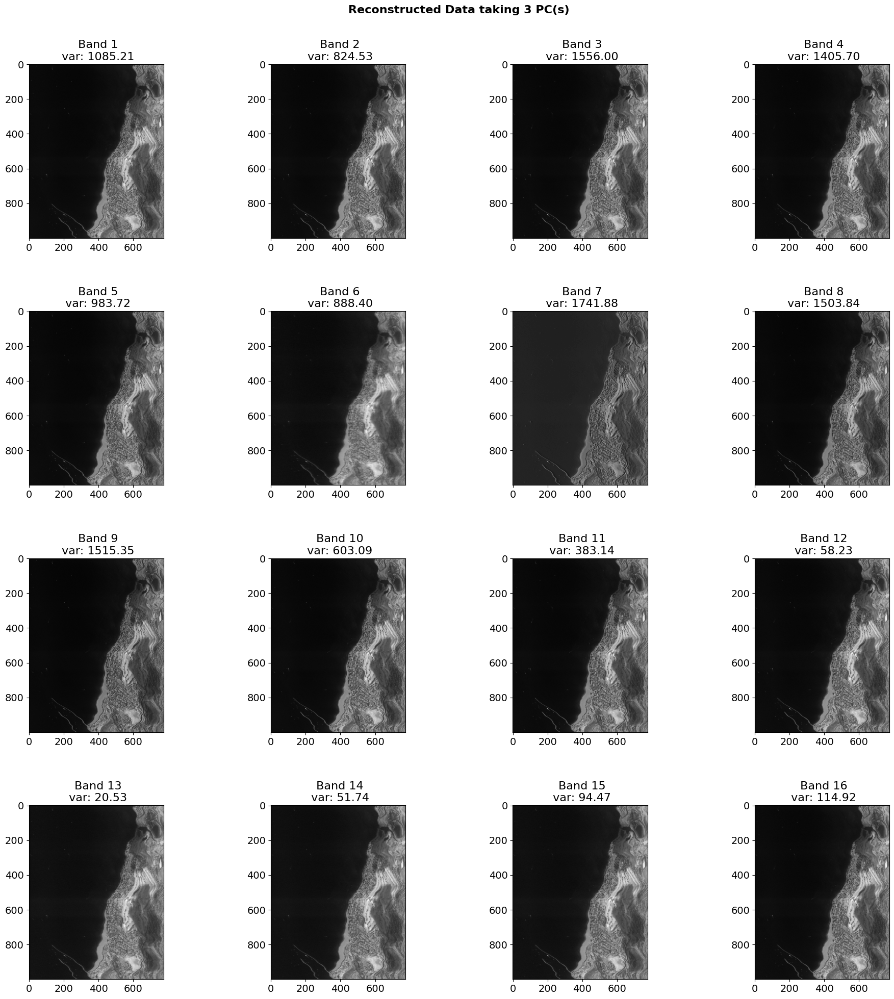

In [49]:
## Taking 3 Principal Components

napc_misi_dataset_3 = preserve_npc(3, principal_components_napc, evecs, whitening_matrix)







**Taking 5 PCs**

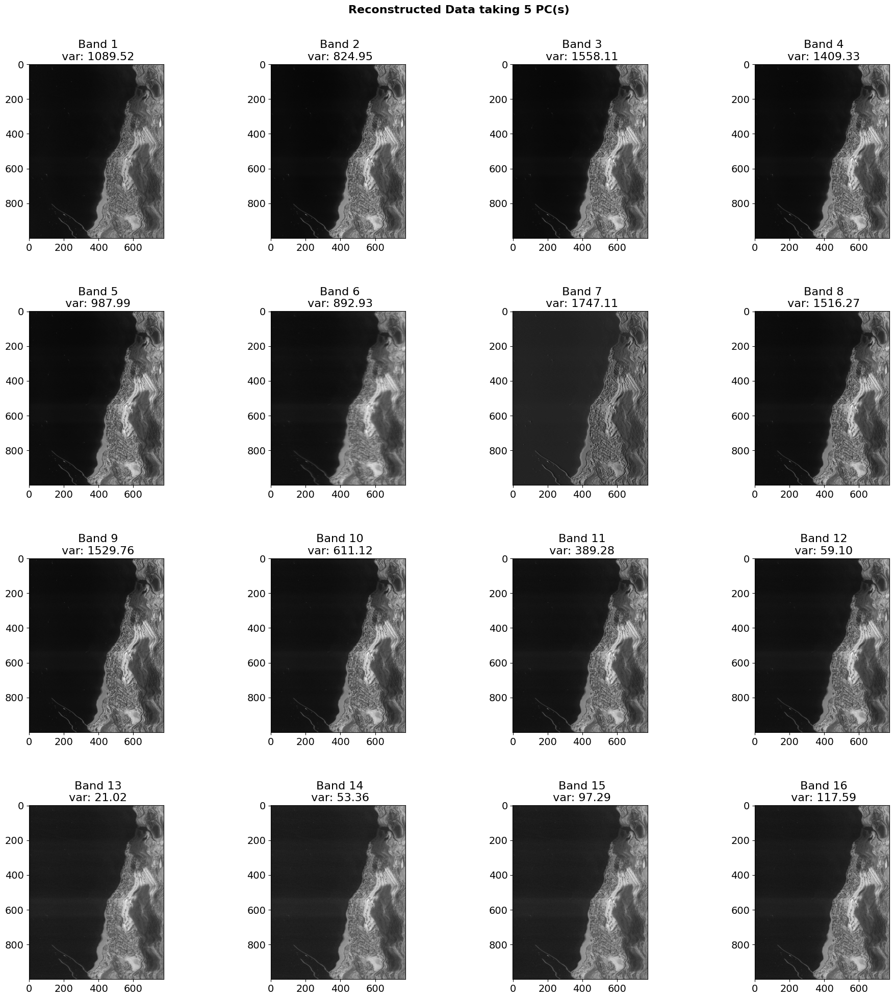

In [50]:
## Taking 5 Principal Components

napc_misi_dataset_5 = preserve_npc(5, principal_components_napc, evecs, whitening_matrix)

**NAPC PRODUCES MUCH CLEANER RESULTS: The result with NAPC are much more clean. We can see that horizontal "strip" along the image that was still present in PCA result but here it disappears giving high SNR pixels in almost all the bands. It is due to the noise adjustement before performing PCA. We whitened the original data using noise data that distributes noise equally over whole image rather than some regions in the image and this noise appears in higher PC components with much cleaner some first PC components**

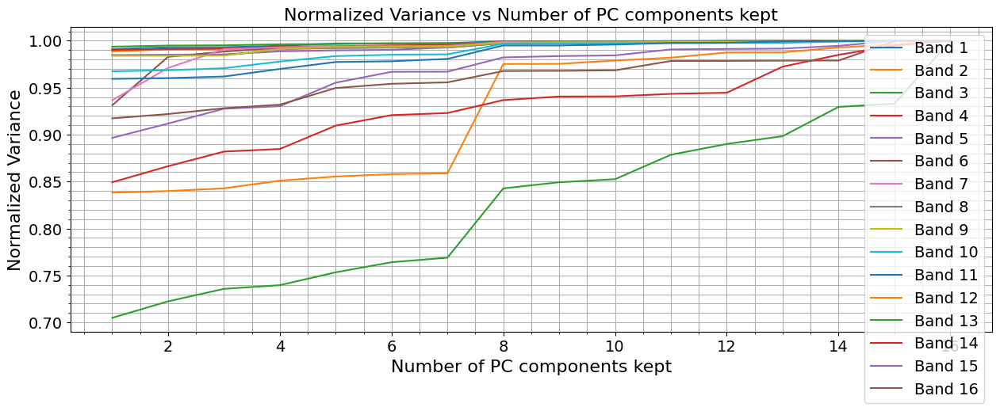

In [51]:
# Plot of band kept vs variance 

plot_var(np.linalg.inv(whitening_matrix), principal_components_napc, evecs)

**We can see similar trend as that of "regular" PCA where for almost 11 band the variance does not decrease significantly when we decrease the number of bands or PC components. However affter those band we 
we can see the decrease is significant.**